# Fix pathing

In [1]:
import sys


sys.path.append("..")


In [2]:
import constants

import os


constants.PROJECT_DIRECTORY_PATH = os.path.dirname(os.path.dirname(constants.PROJECT_DIRECTORY_PATH))


# Init

In [3]:
import datahandler


dataset_id = "oslo"

data_preprocessor = datahandler.DataPreprocessorOUS(dataset_id)
data_preprocessor.execute()

data_loader = datahandler.DataLoader(dataset_id)
data_loader.execute()


Loading dataset: 100%|██████████| 6/6 [00:14<00:00,  2.41s/it]


# Imports

In [4]:
import utils

import folium
import matplotlib
import matplotlib.pyplot as plt
import numpy as np


# Plot processed data

In [5]:
df = utils.copy_dataframe(data_loader.processed_incidents_df)

df.drop_duplicates(subset="grid_id", inplace=True)

# Create a base map centered around the average latitude and longitude
m = folium.Map(location=[df["longitude"].mean(), df["latitude"].mean()], zoom_start=10)

# Add rectangles for each row in the dataframe
for _, row in df.iterrows():
    folium.Polygon(locations=utils.get_cell_corners(row['easting'], row['northing']), color='blue', fill=True, fill_opacity=0.3).add_to(m)

m


In [6]:
# Count the frequency of each grid_id
grid_id_count = data_loader.enhanced_incidents_df["grid_id"].value_counts()
grid_id_count_log = np.log1p(grid_id_count)

# Normalize the frequencies
max_count = grid_id_count_log.max()
min_count = grid_id_count_log.min()
norm = plt.Normalize(min_count, max_count)

# Create a colormap
colormap = matplotlib.colormaps["viridis"]

# Create a base map centered around the average latitude and longitude
m = folium.Map(location=[df["longitude"].mean(), df["latitude"].mean()], zoom_start=10)

# Add rectangles for each row in the dataframe
for _, row in df.iterrows():
    freq = grid_id_count.get(row["grid_id"], 0)
    freq_log = np.log1p(freq)
    rgba_color = [int(x * 255) for x in colormap(norm(freq_log))[:3]]
    hex_color = "#{:02x}{:02x}{:02x}".format(*rgba_color)

    folium.Polygon(
        locations=utils.get_cell_corners(row["easting"], row["northing"]),
        color=None,
        fill=True,
        fill_color=hex_color,
        fill_opacity=0.7,
        tooltip=f"{freq}"
    ).add_to(m)

m


# Plot enhanced data

In [7]:
df = utils.copy_dataframe(data_loader.enhanced_incidents_df)

df.drop_duplicates(subset="grid_id", inplace=True)

# Create a base map centered around the average latitude and longitude
m = folium.Map(location=[df["longitude"].mean(), df["latitude"].mean()], zoom_start=10)

# Add rectangles for each row in the dataframe
for _, row in df.iterrows():
    folium.Polygon(locations=utils.get_cell_corners(row['easting'], row['northing']), color='blue', fill=True, fill_opacity=0.3, tooltip=f"{row['id']}").add_to(m)

m


In [8]:
# Count the frequency of each grid_id
grid_id_count = data_loader.enhanced_incidents_df["grid_id"].value_counts()
grid_id_count_log = np.log1p(grid_id_count)

# Normalize the frequencies
max_count = grid_id_count_log.max()
min_count = grid_id_count_log.min()
norm = plt.Normalize(min_count, max_count)

# Create a colormap
colormap = matplotlib.colormaps["viridis"]

# Create a base map centered around the average latitude and longitude
m = folium.Map(location=[df["longitude"].mean(), df["latitude"].mean()], zoom_start=10)

# Add rectangles for each row in the dataframe
for _, row in df.iterrows():
    freq = grid_id_count.get(row["grid_id"], 0)
    freq_log = np.log1p(freq)
    rgba_color = [int(x * 255) for x in colormap(norm(freq_log))[:3]]
    hex_color = "#{:02x}{:02x}{:02x}".format(*rgba_color)

    folium.Polygon(
        locations=utils.get_cell_corners(row["easting"], row["northing"]),
        color=None,
        fill=True,
        fill_color=hex_color,
        fill_opacity=0.7,
        tooltip=f"{freq}"
    ).add_to(m)

m


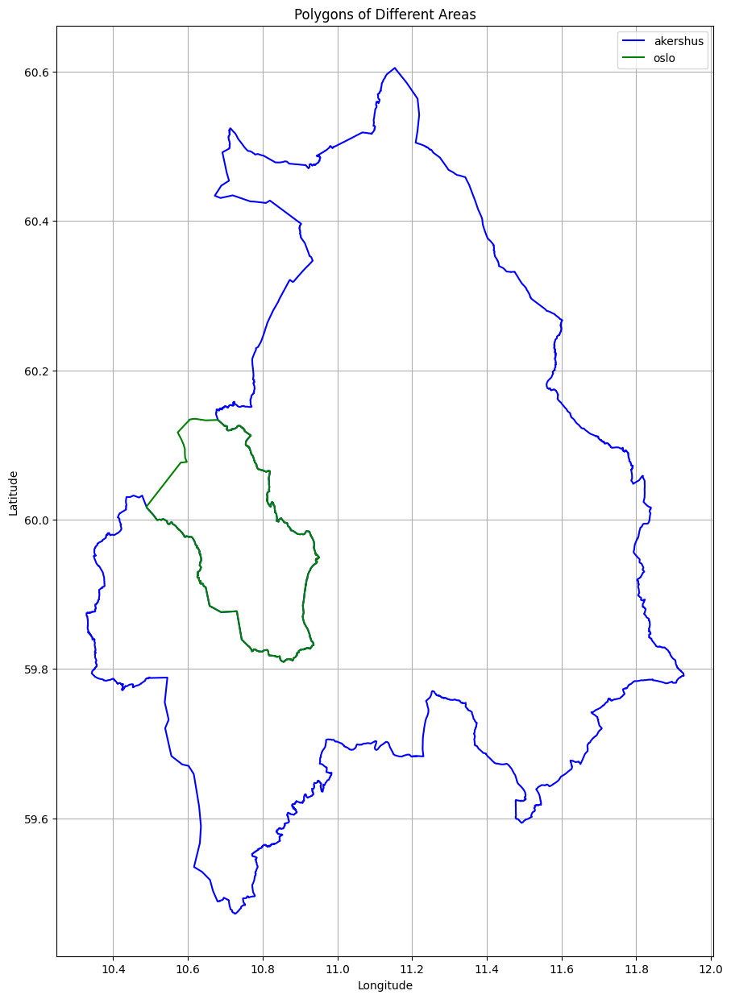

In [9]:
# Call the corrected function to plot the GeoJSON polygons in a single plot
utils.plot_multiple_geojson_polygons_in_one_plot_corrected(
    file_paths=[
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2019_akershus_polygon_epsg4326.geojson"),
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2019_oslo_polygon_epsg4326.geojson")
    ],
    labels=["akershus", "oslo"],
    colors=["blue", "green"]
)

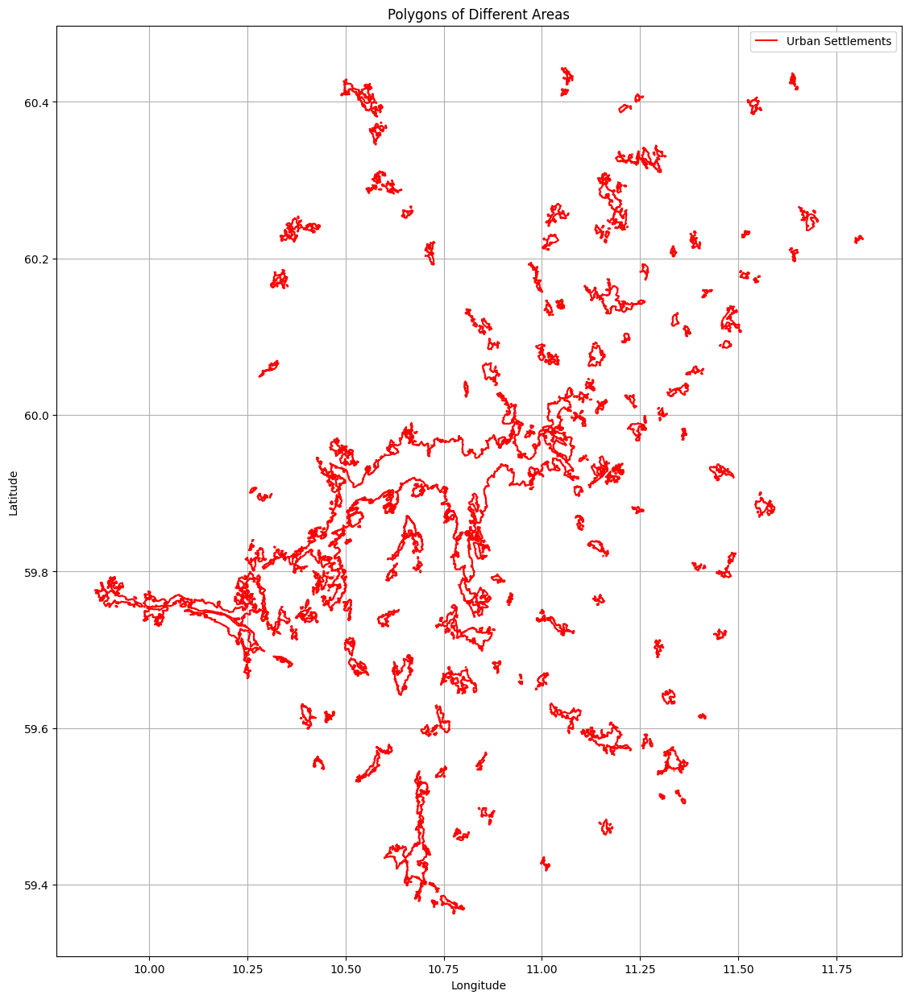

In [10]:
# Call the corrected function to plot the GeoJSON polygons in a single plot
utils.plot_multiple_geojson_polygons_in_one_plot_corrected(
    file_paths=[
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2021_urban_settlements_polygon_epsg4326.geojson")
    ],
    labels=["Urban Settlements"],
    colors=["red"]
)

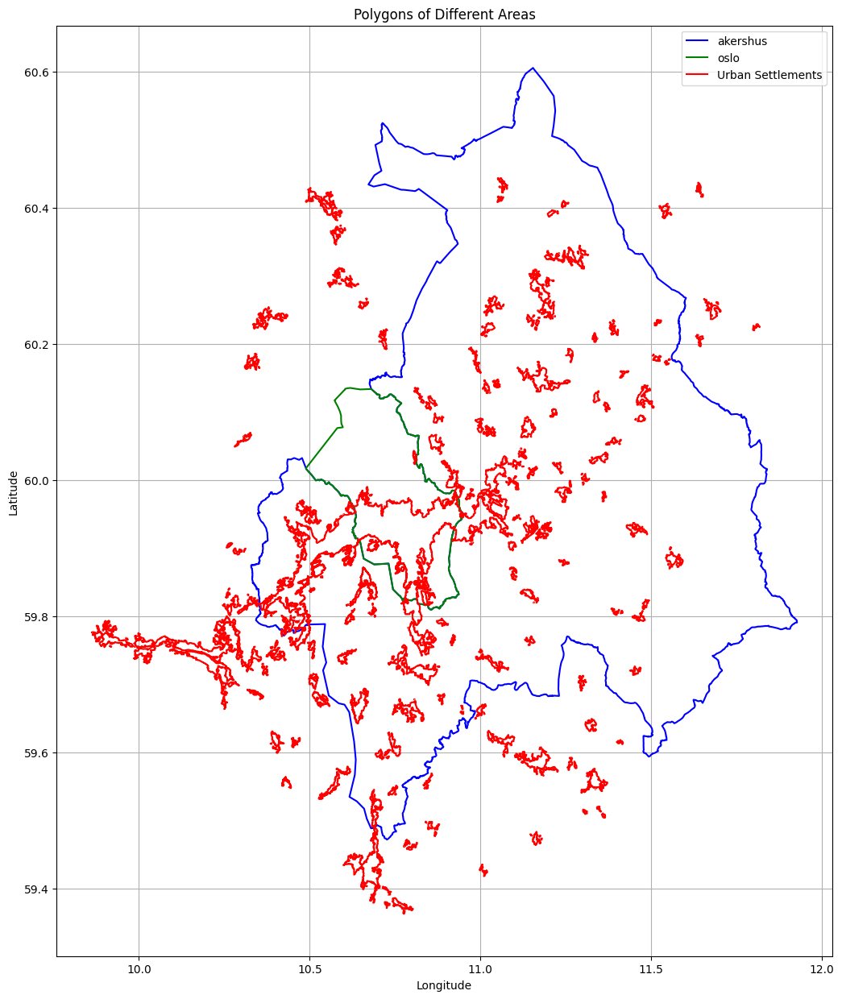

In [11]:
# Call the corrected function to plot the GeoJSON polygons in a single plot
utils.plot_multiple_geojson_polygons_in_one_plot_corrected(
    file_paths=[
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2019_akershus_polygon_epsg4326.geojson"),
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2019_oslo_polygon_epsg4326.geojson"),
        os.path.join(constants.PROJECT_DIRECTORY_PATH, "data", "ssb_2021_urban_settlements_polygon_epsg4326.geojson")
    ],
    labels=["akershus", "oslo", "Urban Settlements"],
    colors=["blue", "green", "red"]
)